<a href="https://colab.research.google.com/github/Pranav-Nirbhavane/Dog-Vision/blob/main/end_to_end_dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **🐶 End-to-End Multi-Class Dog Breed Classification**

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## **1. Problem**

Identifying the breed of a dog given an image of a dog.

When I'm siting at the cafe andI take photo of a dog, I want to know what breed of dog it is.

## **2. Data**

The data we are using is from Kaggle's Dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification

## **3. Evaluation**

The evaluation is a file with prediction probabolities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## **4. Features**

Some information about the data:
* We are dealing with images (unstructured data) so its probably we use deep learning/ transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# !unzip '/content/drive/MyDrive/dog-breed-identification.zip' -d '/content/drive/MyDrive/Colab Notebooks/Dog Vision'

# **0. Get out workspace ready!**

* Import tensorflow 2.x ✅
* Import Tensorflow Hub ✅
* Make sure we are using a GPU ✅


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

print("TF version: ", tf.__version__)
print('TF Hub version: ', hub.__version__)

# Check for GPU availability
print('GPU', "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version:  2.17.0
TF Hub version:  0.16.1
GPU available (YESSSS!!!!!)


# **1. Getting our data ready (turning into Tensors)**

With all machine learning models, our data has to be in numerical format. So thats what we will be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Dog Vision/labels.csv')
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

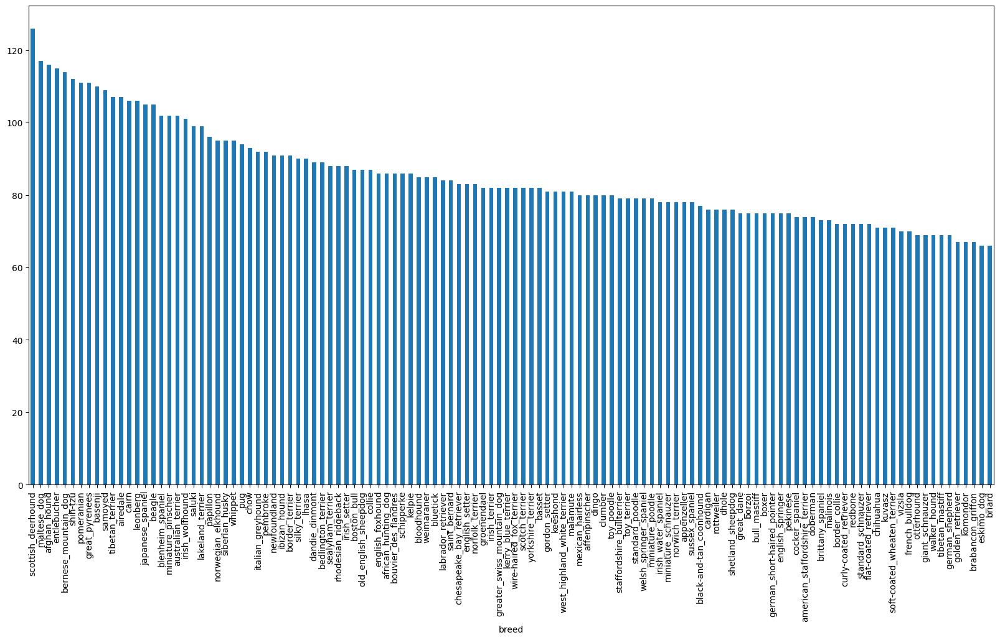

In [ ]:
# How many images are for each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

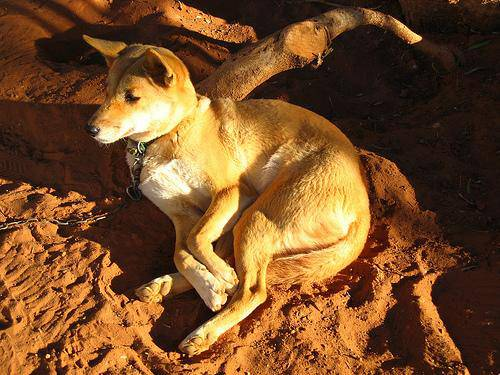

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

# Getting images and their labels

Lets det a list of all of our image file pathnames.

In [ ]:
# Create pathnames from image ID's
filenames = []
for i in labels_csv['id']:
    filenames.append(f'/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/{i}.jpg')
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir('/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/')[:10]

['e153e4725d7323d1833817d7cc1c9b01.jpg',
 'dcfb91097cb730519db11709821e3afb.jpg',
 'e5955cf16bd1c54a1e80f5a031851482.jpg',
 'e5ec89512b1aa4594fffa72867874a27.jpg',
 'e36f90b1dd7921dceb536c79989fe69f.jpg',
 'df12a66b9b154c8bbe922846944e2ef2.jpg',
 'de33550ba1323a0376fc1292a1d25d71.jpg',
 'e36c116cdff32db5d5b87b3c789ce46c.jpg',
 'e673bb6ca717b8dffe3b5ba35da07a83.jpg',
 'e8cd220184f16fde613b32d157699edf.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/")) == len(filenames):
  print('Filenames match actual amount of files!')
else:
  print('Filenames do not match actual amount of files, check the target directory.')

Filenames match actual amount of files!


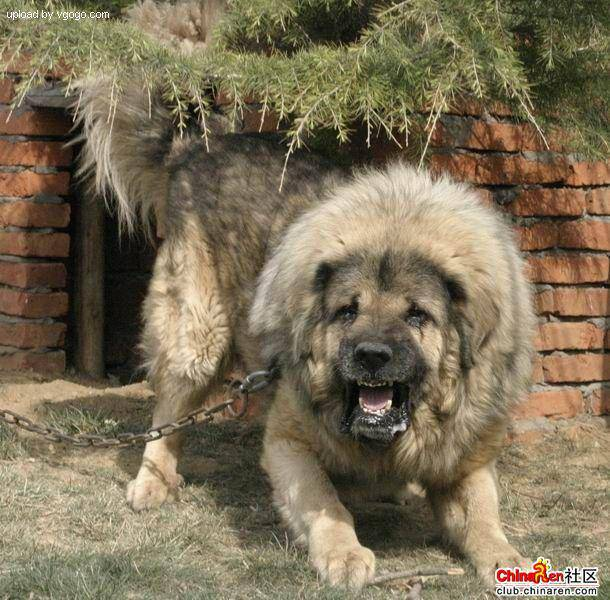

In [ ]:
# One more check
Image(filenames[9000])

Since we have now got our training image filepaths in a list, lets prepare our labels

In [ ]:
import numpy as np
labels = np.array(labels_csv['breed'])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number if labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels do not match number of filenames, check data directories!')

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into booleans array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean arrays into integers
# original label
print(labels[0])
# index where label occurs
print(np.where(unique_breeds == labels[0]))
# index where label occurs in boolean array
print(boolean_labels[0].argmax())
# there will be a 1 where the sample label occurs
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own validation sets

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

**We are going to start off experimenting with ~1000 images and increase as needed.**

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000  #@param {type:'slider', min:1000, max: 10000, step:1000}

In [ ]:
# Lets split our data into train test split
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train) , len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
     

# Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we are going to write a function which does a few things:
1. Take the image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
4. Resize the `image` to be shape of (224, 224)
5. Return the modified image

Before we do, lets see what importing an image looks like.

In [ ]:
# Convert an image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
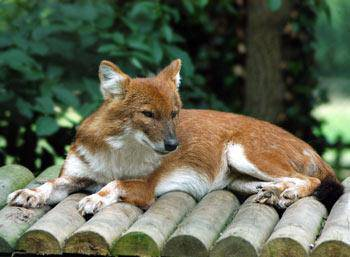

In [ ]:
image

In [ ]:
# Turn image into a Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we have seen what a image looks like as a tensor, lets make a function to preprocess them.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function to preprocess images
def preprocess_image(image_path, img_size=IMG_SIZE):
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0 to 255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

# Turning our data into batches

Why turn our data into batches?

Lets say you are trying to process 10,000+ images in one go... they all might not fit into memory.

So thats why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:

`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = preprocess_image(image_path)
  return (image, label)

In [ ]:
# Demo of the above
(preprocess_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now that we have got a way to tuen our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all of our data (`X` & `y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a furnction to turn the data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # If the data is a tset dataset, we probably don't have labels.
  if test_data:
    print(" Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid Dataset, we dont need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image preprocessor functionis faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this is also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout the different attributes of out data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/ comprehend, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

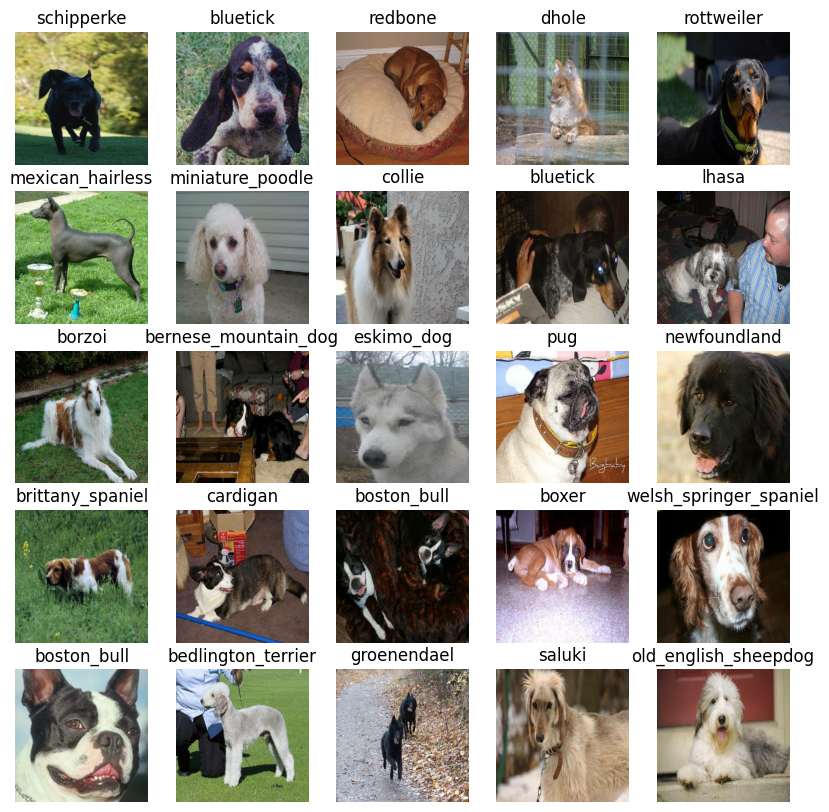

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

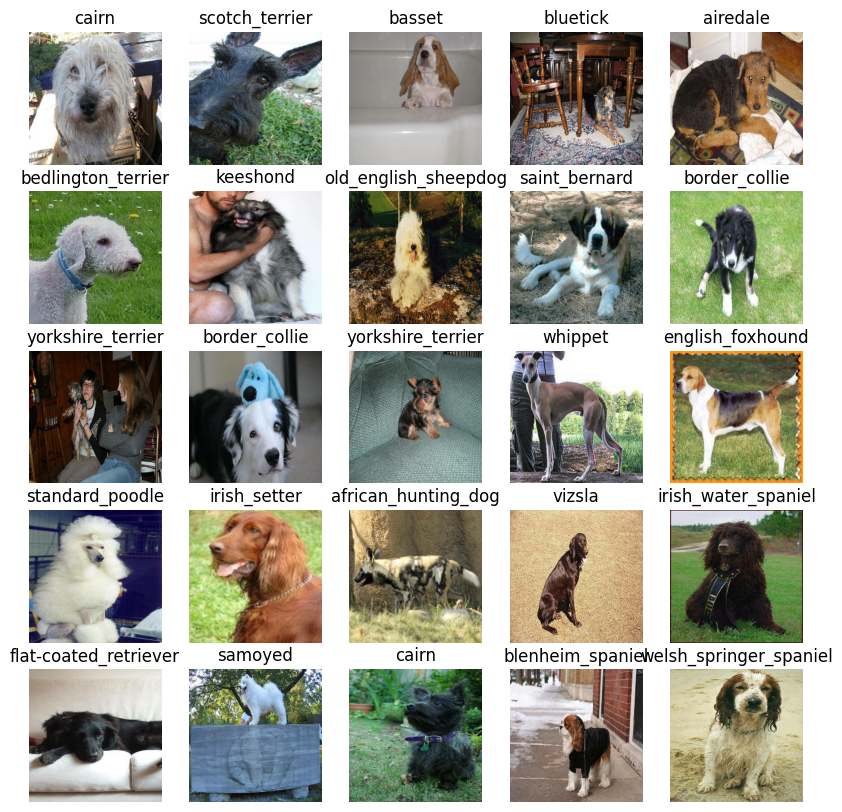

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# **Building our model**

Before we build a model, there are a few things we need to define:


*   The input shape (our image shape, in the form of Tensors) to our model.
*   The output shape (image labels, in the form of Tensors) of our model.
*   The URL of the model we want to use from TensorFlow Hub - https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification



In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we have got out inputs, outputs and model ready to go. Lets put them together into Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we have chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (say it should be evaluated and improved).
* Build the model (tells the model the input shape it'll be getting).
* Returns the model.


In [ ]:
import tf_keras as keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a tensorboard callback we need to do 3 things
1. Load the TensorBoard notebook ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Dog Vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping




In [ ]:
# Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                               patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# Check to make sure we are stil running on a GPU
print('GPU', 'available :)' if tf.config.list_physical_devices('GPU') else 'not available :(')

GPU available :)


Let's create a function which trains a model.

* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callback we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns a trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 166s 6s/step - loss: 4.6250 - accuracy: 0.0825 - val_loss: 3.4719 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 172ms/step - loss: 1.6761 - accuracy: 0.6662 - val_loss: 2.2299 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 5s 208ms/step - loss: 0.5870 - accuracy: 0.9325 - val_loss: 1.6967 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 149ms/step - loss: 0.2598 - accuracy: 0.9875 - val_loss: 1.5181 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 148ms/step - loss: 0.1494 - accuracy: 0.9975 - val_loss: 1.4355 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 5s 203ms/step - loss: 0.1011 - accuracy: 0.9987 - val_loss: 1.3890 - val_accuracy: 0.6450
Epoch 7/100
25/25 [================

## Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 11s 112ms/step


array([[1.3857587e-04, 2.0868375e-04, 7.7147590e-04, ..., 1.7843505e-04,
        2.8548393e-06, 4.0111281e-03],
       [3.5545186e-04, 4.2124809e-04, 2.0677038e-03, ..., 2.7992536e-04,
        3.1917484e-04, 4.5435696e-05],
       [1.4863705e-04, 8.5182517e-05, 1.5239976e-04, ..., 1.1020777e-04,
        5.9224301e-05, 6.4228295e-04],
       ...,
       [1.2920390e-05, 1.3557405e-05, 2.1752359e-04, ..., 1.8895955e-05,
        2.2725925e-04, 8.0305246e-05],
       [2.1272441e-03, 1.1197682e-04, 8.4155516e-05, ..., 1.5054125e-04,
        7.0847869e-05, 5.0140256e-03],
       [3.6220567e-04, 1.3745188e-04, 2.7591193e-03, ..., 2.6115777e-03,
        3.0197985e-03, 2.8152461e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First Predictions
index = 42
print(predictions[index])
print(f'Max value (probability of predictions): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[3.09029056e-05 3.03862646e-04 4.30897344e-05 7.84921212e-05
 1.22124155e-03 7.85414668e-05 8.27517433e-05 1.75461674e-03
 5.26619004e-03 4.32416014e-02 1.51451923e-05 4.16299154e-05
 2.57306010e-03 1.29823862e-02 3.75131553e-04 1.99107686e-04
 9.21132669e-05 4.61959746e-04 1.89449551e-04 1.32381078e-03
 1.04976272e-04 1.22007856e-03 3.98541924e-05 1.71195425e-05
 1.36571173e-02 1.44711506e-04 4.83776967e-05 7.54709545e-05
 7.21715449e-04 7.05160564e-05 1.21701123e-04 9.29296715e-04
 1.07273110e-04 1.20608325e-04 6.99819866e-05 2.64597420e-05
 1.73407374e-04 1.74419780e-04 5.56968407e-05 3.08843642e-01
 7.40251155e-04 7.34689529e-05 4.07956121e-03 9.95006394e-06
 2.33102153e-04 8.17603268e-06 3.39685212e-04 6.25822111e-04
 3.98264565e-05 3.09032621e-04 4.89135709e-05 9.52553964e-05
 2.18828893e-04 1.11687800e-03 6.16912121e-06 2.33326457e-04
 1.30444401e-04 2.71645185e-05 2.25760101e-04 3.53494252e-05
 5.17567751e-05 1.33298407e-03 5.17818262e-06 1.17034593e-04
 8.89067596e-05 1.046084

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image on which the prediction is being made on!

**NOTE**: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction Probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the ation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batch dataset of (image, label) Tensors and returns separate arrays of images and labels.
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (Truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of predictionprobabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

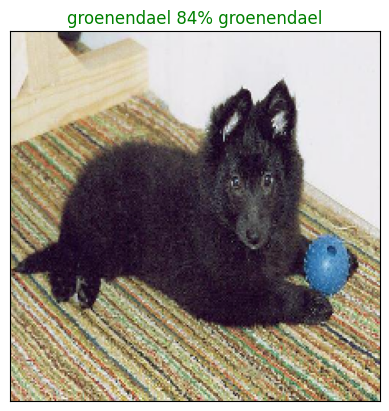

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top 10 prediction, let's make another to view our modes top 10 predictions.

This function will:
* Take an input of prediction probabilties array and a ground truth array and an integer. ✅
* Find the prediction using `get_pred_label()` ✅
* Find top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, colouring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest predictions confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidences values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

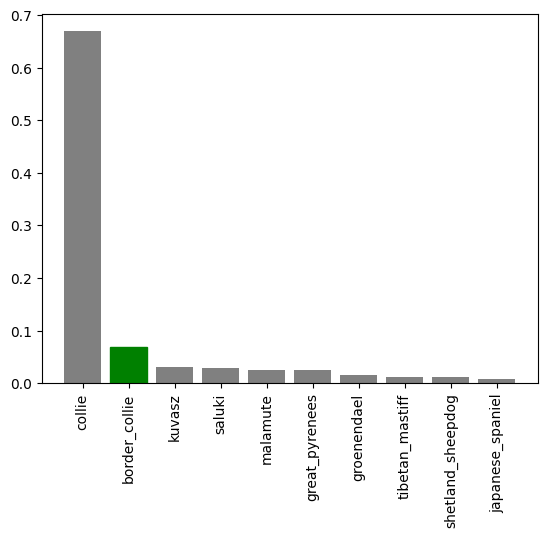

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

Now we've got some functions to visualize our predictions and evaluate our model, lets check out a few.

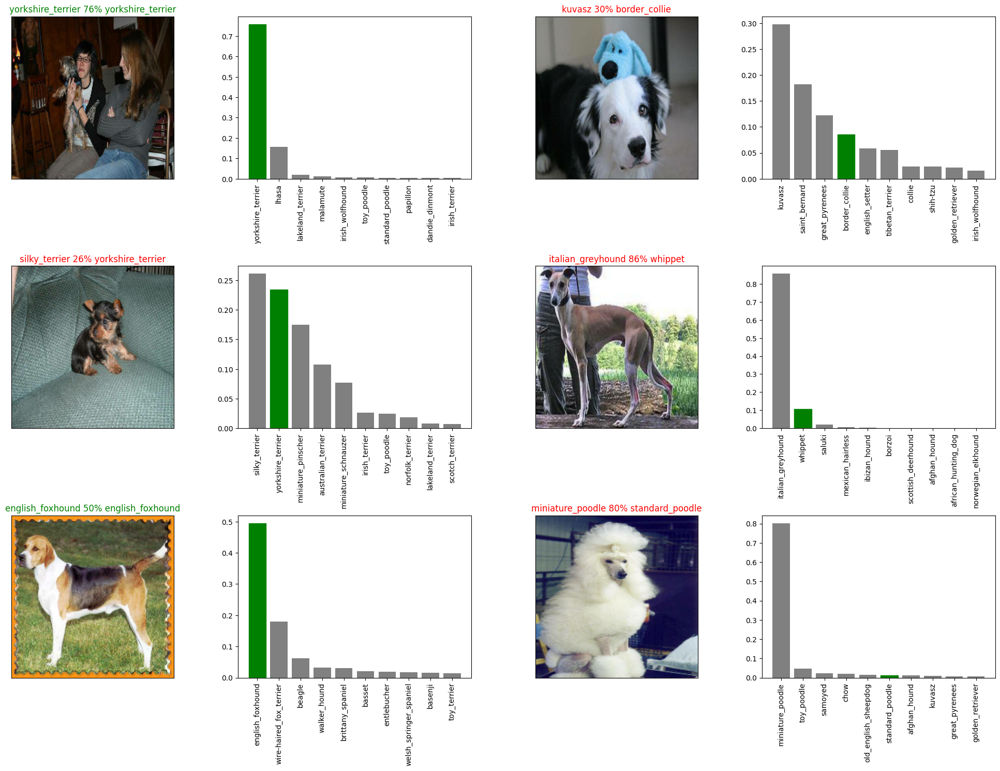

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model



In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a models directory and append a suffix (string).
  '''

  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = keras.models.load_model(model_path,
                                  custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 imgaes
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241107-20211731010879-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241107-20211731010879-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241106-21181730927886-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241106-21181730927886-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 153ms/step - loss: 1.2930 - accuracy: 0.6450


[1.2930103540420532, 0.6449999809265137]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 95ms/step - loss: 1.3505 - accuracy: 0.6400


[1.350467324256897, 0.6399999856948853]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Creaet a data batch with full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we cant monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor='accuracy',
                                                          patience=3)

**NOTE**: Running the cell below will take a little while (maybe up to 30 mins for thr first epoch) because the GPU we're using in the runtime has to load all the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1614s 5s/step - loss: 1.3060 - accuracy: 0.6733
Epoch 2/100
320/320 [==============================] - 43s 134ms/step - loss: 0.3944 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 44s 137ms/step - loss: 0.2360 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 43s 134ms/step - loss: 0.1517 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1050 - accuracy: 0.9801
Epoch 6/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0765 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0585 - accuracy: 0.9902
Epoch 8/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0468 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0372 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 42s 130ms

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241107-21081731013720-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241107-21081731013720-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241107-21081731013720-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20241107-21081731013720-full-image-set-mobilenetv2-Adam.h5


## **Making predictions on the test dataset**

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and covert them into Tensor batches.

To make predictions on the tes data, we'll:
* Get the test image filenames ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data`
parameter to `True` (since the test data doesnt have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e3cec8d0c1876ac36942d35f64b9dfa0.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e6ec1891d8f52a13683c73cabd3045cb.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/df624595296500c98e3a1bf4d9ea917b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e2caef2df1087702936298aaac7843a1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e55534e27f92b4c8177ed2beb1cbba7b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e73d52671c56e1507fed58c4c287d5f1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e70ffd525a15ed3eb30a8c25869bc755.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e103930a8a4416f076c81a51907a7512.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

 Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE**: Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~ 1 hr).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 244s 737ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt('/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv',test_predictions, delimiter=',')

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv',delimiter=',')

In [ ]:
test_predictions[:10]

array([[4.62846612e-13, 5.46670904e-08, 2.80208842e-11, ...,
        1.04128446e-07, 1.11671703e-08, 6.96797871e-13],
       [4.58735827e-11, 1.70382927e-13, 3.36193677e-11, ...,
        2.33254416e-09, 4.23425028e-09, 9.88737954e-13],
       [9.37986133e-10, 1.17863239e-08, 1.04389131e-09, ...,
        4.49117891e-07, 2.46377283e-04, 4.15772945e-08],
       ...,
       [3.07541526e-09, 3.07024696e-12, 2.51567673e-11, ...,
        3.66171225e-11, 8.71315260e-12, 8.38940029e-12],
       [3.58435816e-11, 1.89963850e-10, 3.81043890e-07, ...,
        5.06716460e-05, 1.01418507e-09, 1.18635185e-07],
       [1.29859368e-09, 2.58139238e-07, 1.61953173e-10, ...,
        5.20185779e-08, 1.54170939e-05, 6.01952044e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

## **Preparing test dataset predictions for Kaggle**

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas Dataframe with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths. ✅
* Add data (the prediction probabilities) to each of the dog breed columns. ✅
* Export the Dataframe as a CSV to submit it to Kaggle. ✅

In [ ]:
# Create a pandas Dataframe with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions Dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e05367db91d0449b2afe76a1b7acc1c8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3cec8d0c1876ac36942d35f64b9dfa0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2c0a9f66153b81eb27bb1bceb8c18dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6ec1891d8f52a13683c73cabd3045cb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df624595296500c98e3a1bf4d9ea917b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e05367db91d0449b2afe76a1b7acc1c8,4.628466e-13,5.466709e-08,2.802088e-11,4.628343e-09,3.959641e-12,5.461991e-10,9.679258e-11,5.995212e-13,3.461103e-10,...,7.332512e-09,1.852605e-10,4.557987e-09,1.615637e-10,3.435038e-07,1.300986e-11,1.474477e-12,1.041284e-07,1.116717e-08,6.967979e-13
1,e3cec8d0c1876ac36942d35f64b9dfa0,4.587358e-11,1.703829e-13,3.361937e-11,5.127546e-10,1.347754e-04,1.187854e-11,8.345211e-10,5.762166e-13,1.102453e-12,...,6.644454e-10,1.166306e-11,1.617656e-11,3.089381e-10,6.977866e-12,3.904751e-12,3.717021e-10,2.332544e-09,4.234250e-09,9.887380e-13
2,e2c0a9f66153b81eb27bb1bceb8c18dd,9.379861e-10,1.178632e-08,1.043891e-09,4.014789e-08,3.693127e-11,5.555842e-08,5.452418e-07,8.137823e-10,1.158323e-12,...,1.419932e-09,3.030388e-08,4.013421e-10,3.484596e-07,4.907602e-10,3.130911e-11,3.363516e-11,4.491179e-07,2.463773e-04,4.157729e-08
3,e6ec1891d8f52a13683c73cabd3045cb,1.868890e-05,1.005829e-09,1.093743e-08,7.416328e-04,8.175167e-09,4.150534e-09,2.611946e-11,6.428274e-10,3.034675e-12,...,3.432859e-08,3.198327e-10,1.121783e-10,2.288485e-10,5.397643e-10,4.501128e-09,1.098453e-09,2.435596e-07,1.295352e-03,1.854677e-07
4,df624595296500c98e3a1bf4d9ea917b,1.788696e-07,3.419547e-08,6.551446e-07,1.289597e-09,2.272714e-07,3.793011e-10,2.003247e-03,4.054125e-09,1.620770e-08,...,1.935854e-07,1.501482e-07,2.255682e-08,1.740051e-11,1.237510e-08,5.508067e-08,1.105901e-06,1.193094e-09,2.250710e-08,4.656756e-01


In [ ]:
# Export the preds_df to CSV
preds_df.to_csv('/content/drive/MyDrive/Colab Notebooks/Dog Vision/full_model_submission_mobilenetV2.csv',
                index=False)

## **Making predictions on custom images**

To make predictions on custom images. we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter as `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels, to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = '/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dog_photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dog_photos/my_dog_breed_2.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dog_photos/my_dog_breed_1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dog_photos/my_dog_breed_3.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

 Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['eskimo_dog', 'german_shepherd', 'labrador_retriever']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

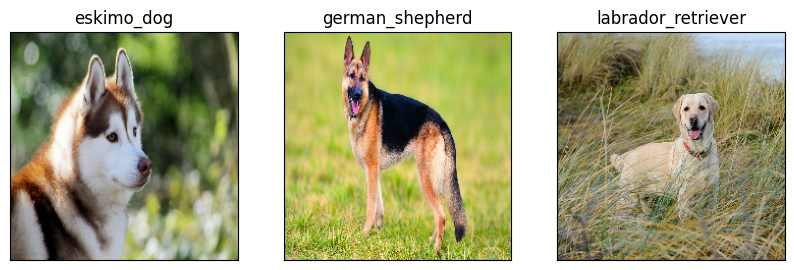

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)